In [33]:
import itertools
import os
import sys
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage.io

from collections import defaultdict
from tqdm.auto import tqdm
from joblib import Parallel, delayed
import re
import h5py
import napari

In [34]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [35]:
data_dir = (Path().cwd().parents[0] / 'data').absolute()
data_raw = r'Y:\coskun-lab\Shuangyi\ERK, YAP project_2022\PLA\HCC827 cell culture'


# Get info

In [12]:
markers_map = {
    'cycle1': {
        1: 'Hoeschst', 
        2: 'TEAD1 & YAP1'
    },
    'cycle2': {
        1: 'Hoeschst', 
        2: 'CylinE & CDK2'
    },
    'cycle3': {
        1: 'Hoeschst', 
        2: 'P-ERK & c-MYC'
    },
    'cycle4': {
        1: 'Hoeschst', 
        2: 'p-AKT & mTOR'
    },
    'cycle5': {
        1: 'Hoeschst', 
        2: 'Mcl-1 & BAK'
    },
    'cycle6': {
        1: 'Hoeschst',
        2: 'p-EGFR',
        3: 'Phalloidin',
        4: 'Tom20'
    },
    'cycle7': {
        1: 'Hoeschst',
        2: 'Pan-cytokeratin',
        3: 'Golph4',
        4: 'Ki67'
    },
    'cycle8': {
        1: 'Hoeschst',
        2: 'NBD-C6',
        4: 'COX IV'
    },
    'cycle9': {
        1: 'Hoeschst',
        2: 'Concanavalin A',
        4: 'WGA'
    },
}

def get_info(data_raw, marker_dict = markers_map):
    timepoints = []
    fovs = []
    cycles = []
    afs = []
    channels = []
    markers = []
    rois = []
    z_stacks = []
    paths = [] 
    
    # Loop through image folder
    for (dirpath, dirnames, filenames) in os.walk(data_raw):
        for name in sorted(filenames):
            if "tif" in name and "stitched" not in name \
            and 'Overlay' not in name \
            and 'Composite' not in name \
            and 'defocused' not in dirpath:
                # Get information from image name
                d_split = dirpath.split('\\')
                n_split = name.split('_')
                                
                time = d_split[-1].split('_')[0]
                fov = d_split[-1].split('_')[-1]
                
                ch = int(n_split[3][2])
                roi = int(n_split[1])
                z = int(n_split[2][1:])
                
                try:
                    cycle = d_split[-1].split('_')[1]
                    if 'Af' in cycle:
                        after_bleach = True
                    else:
                        after_bleach = False
                    cycle = f'cycle{cycle[-1]}'
                    marker = marker_dict[cycle][ch]
                except:
                    continue
        
                timepoints.append(time)
                fovs.append(fov)
                cycles.append(cycle)
                afs.append(after_bleach)
                channels.append(ch)
                markers.append(marker)
                rois.append(roi)
                z_stacks.append(z)
                paths.append(os.path.join(dirpath, name))
                
    info = {
            "Timepoint": timepoints,
            "FOV": fovs,
            "Cycle": cycles,
            "AfBleach": afs,
            "Channels": channels,
            "Markers": markers,
            "ROI": rois,
            "Z": z_stacks,
            "Path": paths
        }

    df = pd.DataFrame(info)
    return df

In [13]:
df_meta_path = data_dir / 'OCT Cell Culture' /'3D' / 'metadata' / 'info.csv'

try:
    df_meta_path.parent.mkdir(parents=True, exist_ok=False)
except FileExistsError:
    print("Folder is already there")

df_exist = df_meta_path.is_file()

if not df_exist:
    print('Created df')
    df = get_info(data_raw)
    df.loc[df.Timepoint == 'HCC827Osimj', 'Timepoint'] = 'HCC827Osim'
    df.loc[df.Timepoint == 'HCC827ctrl', 'Timepoint'] = 'HCC827Ctrl'

    df.to_csv(df_meta_path, index=False)
else:
    print('Loaded df')
    df = pd.read_csv(df_meta_path)

Folder is already there
Loaded df


In [14]:
df = df[df.AfBleach==False]

In [15]:
df.head()

,Timepoint,FOV,Cycle,AfBleach,Channels,Markers,ROI,Z,Path
0,HCC827Osim,FW1,cycle3,False,1,Hoeschst,1,1,"Y:\coskun-lab\Shuangyi\ERK, YAP project_2022\P..."
1,HCC827Osim,FW1,cycle3,False,2,P-ERK & c-MYC,1,1,"Y:\coskun-lab\Shuangyi\ERK, YAP project_2022\P..."
2,HCC827Osim,FW1,cycle3,False,1,Hoeschst,1,2,"Y:\coskun-lab\Shuangyi\ERK, YAP project_2022\P..."
3,HCC827Osim,FW1,cycle3,False,2,P-ERK & c-MYC,1,2,"Y:\coskun-lab\Shuangyi\ERK, YAP project_2022\P..."
4,HCC827Osim,FW1,cycle3,False,1,Hoeschst,1,3,"Y:\coskun-lab\Shuangyi\ERK, YAP project_2022\P..."


In [16]:
df.Timepoint.unique()

array(['HCC827Osim', 'HCC827Ctrl'], dtype=object)

# Save to hdf5

In [17]:
import h5py
import multiprocessing
import functools 

def save_hdf5(
    path: str, name: str, data: np.ndarray, attr_dict=None, mode: str = "a"
) -> None:
    # Read h5 file
    hf = h5py.File(path, mode)
    # Create z_stack_dataset
    if hf.get(name) is None:
        data_shape = data.shape
        data_type = data.dtype
        chunk_shape = (1,) + data_shape[1:]
        max_shape = (data_shape[0],) + data_shape[1:]
        dset = hf.create_dataset(
            name,
            shape=data_shape,
            maxshape=max_shape,
            chunks=chunk_shape,
            dtype=data_type,
            compression="gzip",
        )
        dset[:] = data
        if attr_dict is not None:
            for attr_key, attr_val in attr_dict.items():
                dset.attrs[attr_key] = attr_val
    else:
        print(f"Dataset {name} exists")

    hf.close()

def read_img(path):
    return skimage.io.imread(path)

def joblib_loop(task, pics):
    return Parallel(n_jobs=multiprocessing.cpu_count()//2)(delayed(task)(i) for i in pics)

def save_imgs(df_channel, n, file_path):
    marker = df_channel.iloc[0].Markers
    paths = df_channel.Path.to_numpy()

    imgs = joblib_loop(read_img, paths)
    imgs = np.array(imgs)
    info = {"Cycle": n[0], "Channel": n[1], "Marker": marker, "Z": df_channel.Z.to_numpy()}

    # hdf5 as Channel -> Z mapping
    save_hdf5(file_path, '_'.join(np.array(n).astype(str)), imgs, info)

In [18]:
df_imgs_path = data_dir / 'OCT Cell Culture' / '3D' / 'metadata' / 'imgs.csv'

try:
    df_imgs_path.parent.mkdir(parents=True, exist_ok=False)
except FileExistsError:
    print("Folder is already there")
    
temp_path = data_dir / 'OCT Cell Culture' / '3D' / 'hdf5' / 'ROI_raw'
try:
    temp_path.mkdir(parents=True, exist_ok=False)
except FileExistsError:
    print("Folder is already there")

df_exist = df_imgs_path.is_file()

if not df_exist:
    print('Created df')
    group = df.groupby(['Timepoint', 'FOV', 'AfBleach', 'ROI']) 
    rows = []

    for name, df_group in tqdm(group, total=len(group)):
        print(name)
        file_name = '_'.join(np.array(name).astype(str)) + '.hdf5'
        file_path = temp_path / file_name
        rows.append(list(name)+[file_path])

        group_channel = df_group.groupby(['Cycle', 'Channels'])
        for n, df_channel in group_channel:
            marker = df_channel.iloc[0].Markers
            paths = df_channel.Path.to_numpy()

            imgs = joblib_loop(read_img, paths)
            imgs = np.array(imgs)
            info = {"Cycle": n[0], "Channel": n[1], "Marker": marker, "Z": df_channel.Z.to_numpy()}
            
            # hdf5 as Channel -> Z mapping
            save_hdf5(file_path, '_'.join(np.array(n).astype(str)), imgs, info)
    df_imgs = pd.DataFrame(rows, columns=['Timepoint', 'FOV', 'AfBleach', 'ROI', 'Path'])        
    df_imgs.to_csv(df_imgs_path, index=False)
else:
    print('Loaded df')
    df_imgs = pd.read_csv(df_imgs_path)

Folder is already there
Folder is already there
Loaded df


# Save tiffile

In [62]:
import tifffile as tiff

# Read imgs and blur info
df_imgs_path = data_dir / 'OCT Cell Culture' / '3D' / 'metadata' / 'imgs.csv'
df_imgs = pd.read_csv(df_imgs_path)

save_path = data_dir / 'OCT Cell Culture' / '3D' / 'imgs' / 'raw'
save_path.mkdir(parents=True, exist_ok=True)

In [63]:
group = df_imgs.groupby(['Timepoint', 'FOV'])
for name, df_group in group:
    path = df_group.iloc[0].Path
    for i, row in tqdm(enumerate(df_group.itertuples()), total=len(df_group)):
        path = row.Path

        # Read images
        cycles = []
        imgs_all = []
        channels = []
        with h5py.File(path, "r") as f:
            for k in tqdm(f.keys(), total=len(f.keys()), leave=False):
                cycle = k.split('_')[0]
                channel = f[k].attrs['Channel']

                imgs = f[k][:]
                cycles.append(cycle)
                channels.append(channel)
                imgs_all.append(imgs)
                       
        cycles = np.array(cycles)
        channels = np.array(channels)

        # Get imgs_stacked
        z_min = np.min([i.shape[0] for i in imgs_all])
        imgs_stacked = np.stack([i[:z_min] for i in imgs_all])
        
        # Get imgs_stacked
        z_min = np.min([i.shape[0] for i in imgs_all])
        imgs_stacked = np.stack([i[:z_min] for i in imgs_all])
        for cycle in np.unique(cycles):
            indices = np.where(cycles == cycle)[0]
            imgs = imgs_stacked[indices,...]

            for z in range(imgs.shape[1]):
                 # Create temp path
                name = [row[1], row[2], row[3], row[4], z]
                temp_path =  save_path / '_'.join(np.array(name).astype(str))
                temp_path.mkdir(parents=True, exist_ok=True)

                file_name = f'001_{cycle}.tif'
                file_path = temp_path / file_name

                # Write image
                tiff.imwrite(file_path, imgs[:,z,...])

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

# Registration

In [64]:
from ashlar import fileseries, thumbnail,reg
import matplotlib.pyplot as plt
from ashlar.scripts.ashlar import process_axis_flip

In [65]:
# Loop all images
imgs_dir = data_dir / 'OCT Cell Culture' / '3D' / 'imgs' / 'raw'
save_dir = data_dir / 'OCT Cell Culture' / '3D' / 'imgs' / 'registered'
save_dir.mkdir(parents=True, exist_ok=True)

imgs_dir_list = os.listdir(imgs_dir)

for dir_path in tqdm(imgs_dir_list):
    
    # Create reader for each cycle
    readers = []
    for i in range(1, 10):
        reader = fileseries.FileSeriesReader(
            str(imgs_dir / dir_path),
            pattern='{series}_cycle'+f'{i}.tif',
            overlap=0.29,
            width=1,
            height=1,
            layout='snake',
            direction='horizontal',
            pixel_size=0.18872, 
        )
        readers.append(reader)
    reader_1 = readers[0]
    
    # Run stitching
    aligner0 = reg.EdgeAligner(reader_1, channel=0, filter_sigma=2, verbose=False,)
    aligner0.run()
    
    # Generate merge image for 1 cycle
    # Parramter
    mosaic_args = {}
    mosaic_args['verbose'] = False

    mosaic = reg.Mosaic(
            aligner0,aligner0.mosaic_shape,**mosaic_args
        )
    writer_class = reg.TiffListWriter
    writer = writer_class(
            [mosaic], str(save_dir / (dir_path + '_cycle1_ch{channel}.ome.tif'))
    )
    writer.run()
    
    # Loop through rest of cycles
    aligners = list()
    aligners.append(aligner0)

    for j in range(1, 9):
        aligners.append(
            reg.LayerAligner(readers[j], aligners[0], channel=0, filter_sigma=2, verbose=False)
        )
        aligners[j].run()
        mosaic = reg.Mosaic(
            aligners[j], aligners[0].mosaic_shape,**mosaic_args
        )
        writer = writer_class(
                [mosaic], str(save_dir / (dir_path +'_cycle'+str(j+1)+'_ch{channel}.ome.tif'))
        )
        writer.run()
    

  0%|          | 0/1926 [00:00<?, ?it/s]

    assembling thumbnail 1/1
    assembling thumbnail 1/1


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [ 7. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-40.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  50.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-40.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-40.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  51.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  51.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  51.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  48.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  70.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  49.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  49.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  49.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  50.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998  59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998  56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998  59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998  59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  70.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1

\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(



    estimated cycle offset [y x] = [-30.999998  56.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  70.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998  56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  50.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  51.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  51.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-40.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-40.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  70.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  70.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  70.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-40.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  44.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  43.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  43.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  43.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  50.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  50.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  70.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  70.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  49.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  49.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  49.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 58.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-40.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 58.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-40.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 58.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-40.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 58.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 58.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 58.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-40.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-40.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  67.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  67.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  63.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  63.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  63.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  58.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [22. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [22. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 58.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  51.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  51.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  51.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  51.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  49.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  48.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  49.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  50.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  50.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  49.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  70.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  55.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  70.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  48.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  48.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1

\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(



    estimated cycle offset [y x] = [-34.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  48.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  48.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  48.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1

\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(



    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  70.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  67.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 64.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  58.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  58.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 64.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  58.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 64.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  68.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  58.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  58.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  71.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  69.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  64.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  64.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  66.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  66.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  67.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  51.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  54.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  54.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  54.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 64.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 63.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 63.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  58.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  63.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  63.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  66.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  66.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-39.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  66.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  54.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-38.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-37.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 33.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -4.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 33.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 33.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 34.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [-6. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. -6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. -7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. -9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. -7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. -8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. -9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. -7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  79.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  79.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. -7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  79.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  28.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  27.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  79.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  29.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. -8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  28.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. -7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  28.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  73.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  72.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -5.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. -6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. -7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 76.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 11.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 33.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 33.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 32.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 32.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 33.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 10.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [22. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [22. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [22. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [22. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [22. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 34.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 34.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 19.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 34.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 19.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 34.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [22. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 34.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 19.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 34.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [22. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 34.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 19.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 19.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [23. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [23. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 19.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [22. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 19.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [23. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [22. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [22. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 79.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999  5.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999  6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999  5.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999  6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999  5.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 77.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 78.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  82.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  82.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  82.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1

\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(



    estimated cycle offset [y x] = [ 4.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 19.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 19.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  -2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 86.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1

\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(



    estimated cycle offset [y x] = [12. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 86.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 86.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 86.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 86.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [28. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [28. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 85.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 14.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [23. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1

\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(



    estimated cycle offset [y x] = [-5.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [27. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. -3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [27. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [27. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25.999998 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25.999998 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25.999998 38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   4.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 33.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [23. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [23. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [23. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [23. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [23. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [23. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [23. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 33.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 33.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [25. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 33.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 33.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [24. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [23. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.      83.99999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 83.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 36.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20.999998 37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [20. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [19. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 14.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 14.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  -1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  -1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  -1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   5.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1

\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(



    estimated cycle offset [y x] = [-28.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   0.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  14.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  14.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998  24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  33.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   9.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   9.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1

\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(



    estimated cycle offset [y x] = [ 8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   3.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   4.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  38.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  37.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. -2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  41.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   4.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   2.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.          7.9999995]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [6. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 4.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [8. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   5.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [9. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 19.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 19.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 19.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [11. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 9. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 7. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 6. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   9.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   9.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [-12.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 2. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  10.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  10.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  10.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  10.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   9.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   9.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 1. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  46.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  46.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  45.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  45.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  45.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  46.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  46.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  45.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  46.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  46.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  46.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  46.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  46.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  46.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  45.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  27.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  27.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  27.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   4.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   4.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   4.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  11.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  11.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  61.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [4. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  11.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [5. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  64.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  64.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  20.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  27.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.        20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.        30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 11.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 11.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998   7.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-36.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  55.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  54.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-33.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  54.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-35.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  53.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  54.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-34.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  54.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-32.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  45.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.999998  12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  45.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  48.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-30.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  45.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-29.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-28.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  25.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-9. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-27.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-10.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-23.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  60.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  59.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 17.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 43.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.999998  12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-25.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       41.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-24.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 41.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  67.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  67.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  67.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  68.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  68.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  67.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  68.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  68.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  68.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  67.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-11.  66.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        56.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  14.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  14.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 19.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  15.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  16.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  11.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  11.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  11.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  11.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-8. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  10.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 33.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-7. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 14.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  23.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 14.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [10. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 32.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999   8.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [11. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-6.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  45.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-5. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  24.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.   8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  44.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  56.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  28.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  54.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 18.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  27.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 38.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [17. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [18. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  55.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-15.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  14.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  64.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [14. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  14.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-14.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.        12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  65.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4.       51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [3. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.999999  64.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [12. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 15.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [2. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-12.  65.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1

\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(



    estimated cycle offset [y x] = [-1. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-18.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [0. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-16.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-22.  11.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.        61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1. 46.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 49.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-1.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-4. 50.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0.       46.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    assembling thumbnail 1/1
    estimated cycle offset [y x] = [16.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-2. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-3. 51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-20.999998  12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [1. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [-17.  63.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 1/1
    estimated cycle offset [y x] = [ 0. 48.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


# Save Data

In [69]:
markers_map = {
    'cycle1': {
        'ch0': 'Hoeschst', 
        'ch1': 'TEAD1 & YAP1'
    },
    'cycle2': {
        'ch0': 'Hoeschst', 
        'ch1': 'CylinE & CDK2'
    },
    'cycle3': {
        'ch0': 'Hoeschst', 
        'ch1': 'P-ERK & c-MYC'
    },
    'cycle4': {
        'ch0': 'Hoeschst', 
        'ch1': 'p-AKT & mTOR'
    },
    'cycle5': {
        'ch0': 'Hoeschst', 
        'ch1': 'Mcl-1 & BAK'
    },
    'cycle6': {
        'ch0': 'Hoeschst',
        'ch1': 'p-EGFR',
        'ch2': 'Phalloidin',
        'ch3': 'Tom20'
    },
    'cycle7': {
        'ch0': 'Hoeschst',
        'ch1': 'Pan-cytokeratin',
        'ch2': 'Golph4',
        'ch3': 'Ki67'
    },
    'cycle8': {
        'ch0': 'Hoeschst',
        'ch1': 'NBD-C6',
        'ch2': 'COX IV'
    },
    'cycle9': {
        'ch0': 'Hoeschst',
        'ch1': 'Concanavalin A',
        'ch2': 'WGA'
    },
}

def get_info(data_raw, marker_dict = markers_map):
    timepoints = []
    fovs = []
    rois = []
    Z = []
    cycles = []
    channels = []
    markers = []
    paths = [] 

    # Loop through image folder
    for (dirpath, dirnames, filenames) in os.walk(data_raw):
        for name in sorted(filenames):
            if "tif" in name:
                # Get information from image name
                n_split = name.split('_')
                                
                time=n_split[0]
                fov=n_split[1]
                roi = n_split[3]
                z = n_split[4]
                cycle=n_split[5]
                ch = n_split[6][:3]
                try:
                    marker = marker_dict[cycle][ch]
                except:
                    continue 
                    
                timepoints.append(time)
                fovs.append(fov)
                rois.append(roi)
                Z.append(z)
                cycles.append(cycle)
                channels.append(ch)
                markers.append(marker)
                paths.append(os.path.join(dirpath, name))
                
    info = {
            "Timepoint": timepoints,
            "FOV": fovs,
            "ROI": rois,
            'Z': Z, 
            "Cycle": cycles,
            "Channels": channels,
            "Markers": markers,
            "Path": paths
        }

    df = pd.DataFrame(info)
    return df


def get_min(imgs):
    shapes = np.array([np.array(img.shape) for img in imgs])
    return np.min(shapes, axis=0)

In [73]:
data_raw = data_dir / 'OCT Cell Culture' / '3D' / 'imgs' / 'registered'
df_meta_path = data_dir / 'OCT Cell Culture' / '3D' / 'metadata' / 'info_sti.csv'

try:
    df_meta_path.parent.mkdir(parents=True, exist_ok=False)
except FileExistsError:
    print("Folder is already there")

df_exist = df_meta_path.is_file()

if not df_exist:
    print('Created df')
    df = get_info(data_raw)
    df.to_csv(df_meta_path, index=False)
else:
    print('Loaded df')
    df = pd.read_csv(df_meta_path)

Folder is already there
Loaded df


In [74]:
df_imgs_path = data_dir / 'OCT Cell Culture' / '3D' /  'metadata' / 'imgs_sti.csv'
df_imgs_path.parent.mkdir(parents=True, exist_ok=True)
    
temp_path = data_dir / 'OCT Cell Culture' / '3D' /  'hdf5' / 'registered'
temp_path.mkdir(parents=True, exist_ok=True)

df_exist = df_imgs_path.is_file()

if not df_exist:
    print('Created df')
    group = df.groupby(['Timepoint','FOV', 'ROI', 'Z'])
    rows = []

    for name, df_group in tqdm(group, total=len(group)):
        file_name = '_'.join(np.array(name).astype(str)) + '.hdf5'
        file_path = temp_path / file_name
        rows.append(list(name)+[file_path])
        
        if file_path.exists():
            continue
        
        channels = df_group.Channels.to_list()
        cycles = df_group.Cycle.to_list()
        markers = df_group.Markers.to_list()
        paths = df_group.Path.to_numpy()
            
        imgs = joblib_loop(read_img, paths)
        min_shape = get_min(imgs)
        imgs_cropped = np.array([img[:min_shape[0], :min_shape[1]] for img in imgs])
        info = {"Cycle": cycles, "Channel": channels, "Marker": markers}
            
            # hdf5 as Channel -> Z mapping
        save_hdf5(file_path, 'imgs', imgs_cropped, info)
    df_imgs = pd.DataFrame(rows, columns=['Timepoint', 'FOV', 'ROI', 'Z', 'Path'])        
    df_imgs.to_csv(df_imgs_path, index=False)
else:
    print('Loaded df')
    df_imgs = pd.read_csv(df_imgs_path)

Created df


  0%|          | 0/1926 [00:00<?, ?it/s]

# Next few are code for orginal 3D stitchign and matching per Z

# Image Stitching per z

In [62]:
from ashlar import fileseries, thumbnail,reg
import matplotlib.pyplot as plt
from ashlar.scripts.ashlar import process_axis_flip

    assembling thumbnail 18/18


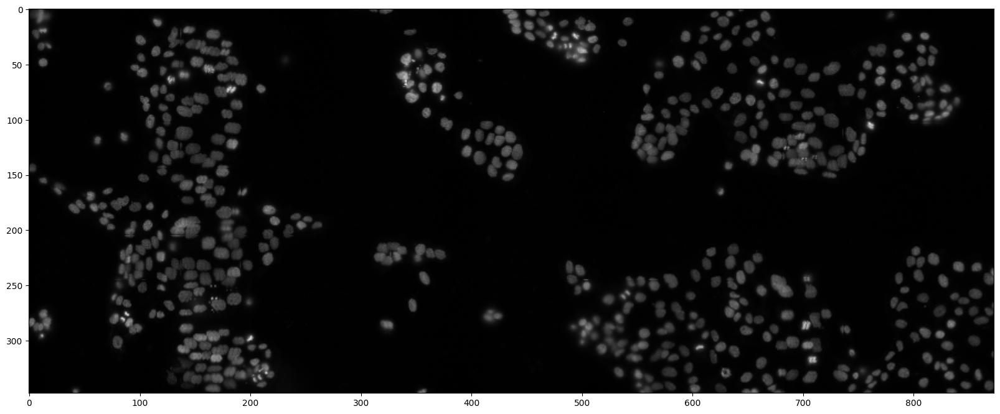

In [65]:
readers = []
for i in range(1, 10):
    reader = fileseries.FileSeriesReader(
        r'Y:\coskun-lab\Thomas\15_PLA\data\OCT Cell Culture\3D\imgs_to_stitch\HCC827Osim_FW2_False_11',
        pattern='{series}_cycle'+f'{i}.tif',
        overlap=0.29,
        width=6,
        height=3,
        layout='snake',
        direction='horizontal',
        pixel_size=0.18872, 
    )
    readers.append(reader)
    


In [67]:
# thumbnail_1 = thumbnail.make_thumbnail(reader_1, channel=1, scale=0.1)

# fig, ax = plt.subplots(figsize=(20,20))
# ax.imshow(thumbnail_1, cmap='gray')

# Apply all image

In [69]:
# 'HCC827Ctrl_FW2'
# 'HCC827Osim'

In [71]:
# Loop all images
thumb_dir = data_dir / 'OCT Cell Culture' / '3D' / 'thumbnails'
imgs_dir = data_dir / 'OCT Cell Culture' / '3D' / 'imgs_to_stitch'  
save_dir = data_dir / 'OCT Cell Culture' / '3D' / 'stitched_3D'  
imgs_dir_list = os.listdir(imgs_dir)

thumb_dir.mkdir(parents=True, exist_ok=True)
save_dir.mkdir(parents=True, exist_ok=True)

for dir_path in tqdm(imgs_dir_list):
    thumb_path = thumb_dir / (dir_path+'.tiff')
    if thumb_path.exists():
        continue
    # if 'HCC827Ctrl_FW2' not in dir_path:
    #     continue
        
    # Create reader for each cycle
    readers = []
    for i in range(1, 10):
        reader = fileseries.FileSeriesReader(
            str(imgs_dir / dir_path),
            pattern='{series}_cycle'+f'{i}.tif',
            overlap=0.29,
            width=6,
            height=3,
            layout='snake',
            direction='horizontal',
            pixel_size=0.18872, 
        )
        readers.append(reader)
        
    # Create thumbnails
    reader_1 = readers[0]
    process_axis_flip(reader_1, flip_x=False, flip_y=False)
    thumbnail_1 = thumbnail.make_thumbnail(reader_1, channel=0, scale=0.5)
    tiff.imwrite(thumb_path, thumbnail_1)
    
    # Run stitching
    aligner0 = reg.EdgeAligner(reader_1, channel=0, filter_sigma=2, verbose=False)
    aligner0.run()
    
    # Generate merge image for 1 cycle
    # Parramter
    mosaic_args = {}
    mosaic_args['verbose'] = False

    mosaic = reg.Mosaic(
            aligner0,aligner0.mosaic_shape,**mosaic_args
        )
    writer_class = reg.TiffListWriter
    writer = writer_class(
            [mosaic], str(save_dir / (dir_path + '_cycle1_ch{channel}.ome.tif'))
    )
    writer.run()
    
    # Loop through rest of cycles
    aligners = list()
    aligners.append(aligner0)

    for j in range(1, 9):
        aligners.append(
            reg.LayerAligner(readers[j], aligners[0], channel=0, filter_sigma=2, verbose=False)
        )
        aligners[j].run()
        mosaic = reg.Mosaic(
            aligners[j], aligners[0].mosaic_shape,**mosaic_args
        )
        writer = writer_class(
                [mosaic], str(save_dir / (dir_path +'_cycle'+str(j+1)+'_ch{channel}.ome.tif'))
        )
        writer.run()
    

  0%|          | 0/84 [00:00<?, ?it/s]

    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12.999999 40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  74.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-22.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.999999  51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-22.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.999999  51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-22.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.999999  51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12.999999 40.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-22.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.999999  51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-36.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-22.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-36.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-22.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-36.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-22.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-36.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-22.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-36.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-22.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-22.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [11. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12.       61.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 82.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-35.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-22.  61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [11. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [11. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.999999  51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [11. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.999999  51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.999999  51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-23.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.999999  51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-22.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.999999  51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 7. 59.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 61.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 81.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-37.  75.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 40.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-22.  60.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.999999  51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [17. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-15.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [ 9. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [17. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [-15.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [15. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [14. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [14. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12.999999 35.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4.  1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 30.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [11. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12.999999 20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [10. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12.999999 22.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.  -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.999999  -1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4.  0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 5. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-12.999999  -1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [17. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 6. 25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-15.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 8. 34.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 16/16
    estimated cycle offset [y x] = [ 7.       25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [12.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(


    estimated cycle offset [y x] = [-12.999999  -1.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. -1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5. 29.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9. 12.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-15.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [14.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.   1.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 1. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-15.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9. 14.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 1. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [15. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 6. 24.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 0. 80.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [15.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.   0.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  2.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.       30.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 9.       12.999999]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [8. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [8. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [7. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [8. 4.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [8. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [8. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [8. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [8. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   5.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [8. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [8. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   5.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [8. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 16/16
    estimated cycle offset [y x] = [  -2. 1386.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   5.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 23.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [8. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 4. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   6.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.  39.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.       20.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5.  8.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.   6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1. 20.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.999998  39.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 2. 19.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [ 3. 22.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [7. 3.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [0. 5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-15.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [15. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-15.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [15. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   9.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  7.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-15.  51.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [15. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   9.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-15.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [15. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   9.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-15.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 16/16
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.999998   9.      ]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 17.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 15/15
    estimated cycle offset [y x] = [14. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-5. 16.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 35.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-20.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.   9.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-14.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-24.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-19.        25.999998]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-24.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.  53.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 37.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-3. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.  5.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    assembling thumbnail 18/18


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [16. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-4. 18.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-7. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-19.  25.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-25.  10.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-1.  6.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-16.        51.999996]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


    assembling thumbnail 18/18
    estimated cycle offset [y x] = [-2. 36.]


\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\thumbnail.py:35: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = phase_cross_correlation(
\\bme-retromaster.ad.gatech.edu\labs5\coskun-lab\thomas\15_pla\src\ashlar-master\ashlar\utils.py:23: FutureWarning: In scikit-image 0.21, phase_cross_correlation will start returning a tuple or 3 items (shift, error, phasediff) always. To enable the new return behavior and silence this warning, use return_error='always'.
  shift = skimage.registration.phase_cross_correlation(


# Convert data to hdf5 

Convert stitch data to hdf5 format.

For each file we are organized into the format of: File -> Cycle 

Attributes are Channels and Markers

In [85]:
markers_map = {
    'cycle1': {
        'ch0': 'Hoeschst', 
        'ch1': 'TEAD1 & YAP1'
    },
    'cycle2': {
        'ch0': 'Hoeschst', 
        'ch1': 'CylinE & CDK2'
    },
    'cycle3': {
        'ch0': 'Hoeschst', 
        'ch1': 'P-ERK & c-MYC'
    },
    'cycle4': {
        'ch0': 'Hoeschst', 
        'ch1': 'p-AKT & mTOR'
    },
    'cycle5': {
        'ch0': 'Hoeschst', 
        'ch1': 'Mcl-1 & BAK'
    },
    'cycle6': {
        'ch0': 'Hoeschst',
        'ch1': 'p-EGFR',
        'ch2': 'Phalloidin',
        'ch3': 'Tom20'
    },
    'cycle7': {
        'ch0': 'Hoeschst',
        'ch1': 'Pan-cytokeratin',
        'ch2': 'Golph4',
        'ch3': 'Ki67'
    },
    'cycle8': {
        'ch0': 'Hoeschst',
        'ch1': 'NBD-C6',
        'ch2': 'COX IV'
    },
    'cycle9': {
        'ch0': 'Hoeschst',
        'ch1': 'Concanavalin A',
        'ch2': 'WGA'
    },
}

def get_info(data_raw, marker_dict = markers_map):
    timepoints = []
    fovs = []
    Zs = []
    cycles = []
    channels = []
    markers = []
    paths = [] 

    # Loop through image folder
    for (dirpath, dirnames, filenames) in os.walk(data_raw):
        for name in sorted(filenames):
            if "tif" in name:
                # Get information from image name
                n_split = name.split('_')
                                
                time=n_split[0]
                fov=n_split[1]
                z=n_split[3]
                cycle=n_split[4]
                ch = n_split[5][:3]
                try:
                    marker = marker_dict[cycle][ch]
                except:
                    continue 
                    
                timepoints.append(time)
                fovs.append(fov)
                Zs.append(z)
                cycles.append(cycle)
                channels.append(ch)
                markers.append(marker)
                paths.append(os.path.join(dirpath, name))
                
    info = {
            "Timepoint": timepoints,
            "FOV": fovs,
            "Z": Zs,
            "Cycle": cycles,
            "Channels": channels,
            "Markers": markers,
            "Path": paths
        }

    df = pd.DataFrame(info)
    return df


def get_min(imgs):
    shapes = np.array([np.array(img.shape) for img in imgs])
    return np.min(shapes, axis=0)

In [83]:
data_raw = save_dir = data_dir / 'OCT Cell Culture' / '3D' / 'stitched_3D'  
df_meta_path = data_dir / 'OCT Cell Culture' / '3D' / 'metadata' / 'info_sti.csv'

try:
    df_meta_path.parent.mkdir(parents=True, exist_ok=False)
except FileExistsError:
    print("Folder is already there")

df_exist = df_meta_path.is_file()

if not df_exist:
    print('Created df')
    df = get_info(data_raw)
    df.to_csv(df_meta_path, index=False)
else:
    print('Loaded df')
    df = pd.read_csv(df_meta_path)

Folder is already there
Created df


In [84]:
df.head()

,Timepoint,FOV,Z,Cycle,Channels,Markers,Path
0,HCC827Ctrl,FW1,0,cycle1,ch0,Hoeschst,Y:\coskun-lab\Thomas\15_PLA\data\OCT Cell Cult...
1,HCC827Ctrl,FW1,0,cycle1,ch1,TEAD1 & YAP1,Y:\coskun-lab\Thomas\15_PLA\data\OCT Cell Cult...
2,HCC827Ctrl,FW1,0,cycle2,ch0,Hoeschst,Y:\coskun-lab\Thomas\15_PLA\data\OCT Cell Cult...
3,HCC827Ctrl,FW1,0,cycle2,ch1,CylinE & CDK2,Y:\coskun-lab\Thomas\15_PLA\data\OCT Cell Cult...
4,HCC827Ctrl,FW1,0,cycle3,ch0,Hoeschst,Y:\coskun-lab\Thomas\15_PLA\data\OCT Cell Cult...


In [86]:
df_imgs_path = data_dir / 'OCT Cell Culture' / '3D' / 'metadata' / 'imgs_sti.csv'

try:
    df_imgs_path.parent.mkdir(parents=True, exist_ok=False)
except FileExistsError:
    print("Folder is already there")
    
temp_path = data_dir / 'OCT Cell Culture' / '3D' / 'hdf5' / 'sti_raw'
try:
    temp_path.mkdir(parents=True, exist_ok=False)
except FileExistsError:
    print("Folder is already there")

df_exist = df_imgs_path.is_file()

if not df_exist:
    print('Created df')
    group = df.groupby(['Timepoint','FOV', 'Z'])
    rows = []

    for name, df_group in tqdm(group, total=len(group)):
        file_name = '_'.join(np.array(name).astype(str)) + '.hdf5'
        file_path = temp_path / file_name
        rows.append(list(name)+[file_path])
        
        if file_path.exists():
            continue
        
        channels = df_group.Channels.to_list()
        cycles = df_group.Cycle.to_list()
        markers = df_group.Markers.to_list()
        paths = df_group.Path.to_numpy()
            
        imgs = joblib_loop(read_img, paths)
        min_shape = get_min(imgs)
        imgs_cropped = np.array([img[:min_shape[0], :min_shape[1]] for img in imgs])
        info = {"Cycle": cycles, "Channel": channels, "Marker": markers}
            
            # hdf5 as Channel -> Z mapping
        save_hdf5(file_path, 'imgs', imgs_cropped, info)
    df_imgs = pd.DataFrame(rows, columns=['Timepoint', 'FOV', 'Z', 'Path'])        
    df_imgs.to_csv(df_imgs_path, index=False)
else:
    print('Loaded df')
    df_imgs = pd.read_csv(df_imgs_path)

Folder is already there
Created df


  0%|          | 0/84 [00:00<?, ?it/s]

In [99]:
import napari 

napari.view_image(imgs_cropped, channel_axis=0, name=markers, visible=False, contrast_limits=[0, 2**16])

Viewer(axes=Axes(visible=False, labels=True, colored=True, dashed=False, arrows=True), camera=Camera(center=(0.0, 1725.5, 4310.0), zoom=0.08933004678498241, angles=(0.0, 0.0, 90.0), perspective=0.0, interactive=True), cursor=Cursor(position=(1, 1), scaled=True, size=1, style=<CursorStyle.STANDARD: 'standard'>), dims=Dims(ndim=2, ndisplay=2, last_used=0, range=((0.0, 3452.0, 1.0), (0.0, 8621.0, 1.0)), current_step=(1726, 4310), order=(0, 1), axis_labels=('0', '1')), grid=GridCanvas(stride=1, shape=(-1, -1), enabled=False), layers=[<Image layer 'Hoeschst' at 0x157afeb3280>, <Image layer 'TEAD1 & YAP1' at 0x157afeb8550>, <Image layer 'Hoeschst [1]' at 0x157afe5f760>, <Image layer 'CylinE & CDK2' at 0x157b5642a30>, <Image layer 'Hoeschst [2]' at 0x157b56e2f10>, <Image layer 'P-ERK & c-MYC' at 0x157b5784430>, <Image layer 'Hoeschst [3]' at 0x157b6683910>, <Image layer 'p-AKT & mTOR' at 0x157b6720df0>, <Image layer 'Hoeschst [4]' at 0x157afff5340>, <Image layer 'Mcl-1 & BAK' at 0x157b6864820